# Модуль А. Анализ и предобработка данных

## Импортирование библиотек

In [ ]:
# библиотека для разархивации данных
import zipfile

# библиотека для визуализации данных
import matplotlib.pyplot as plt

# библиотеки для работы с файлами
import os
import shutil

# библиотека для работы со словарями
from collections import defaultdict

# библиотеки для работы с фотографиями
import cv2
from PIL import Image

# модуль для разделения данных на несколько выборок
from sklearn.model_selection import train_test_split

## Загрузка данных

Для того чтобы начать работать с данными, надо разархивировать их из архива `archive.zip`

In [5]:
path1_to_zip = r'D:\Helper\MLBazyak\homework\\some_data\face_det.zip'  # путь к архиву для детектирования лиц
path1_to_unzip = r'D:\Helper\MLBazyak\homework\\some_data\face_det' # путь, куда будут разархивированы данные

path2_to_zip = r'D:\Helper\MLBazyak\homework\\some_data\face_ind.zip'  # путь к архиву для распознавания лиц
path2_to_unzip = r'D:\Helper\MLBazyak\homework\\some_data\face_ind' # путь, куда будут разархивированы данные

In [18]:
with zipfile.ZipFile(path1_to_zip, 'r') as zip:   # открываем архив для детектирования лиц для чтения как zip
    zip.extractall(path1_to_unzip)            # загружаем все данные 

In [ ]:
with zipfile.ZipFile(path2_to_zip, 'r') as zip:   # открываем архив для распознавания лиц для чтения как zip
    zip.extractall(path2_to_unzip)            # загружаем все данные 

После того, как все данные выгружены, можно начинать с ними работать

## Датасет для детекции лиц

**Структура данных в наборе:**


└── face_ind/    

        └── images/       # папка с фотографиями
            └── train/           # тренировочный набор
                └── 04013.png         # экземпляр фото
                └── 04111.png
                └── 04420.png
                └── 04837.png
                └── etc ...
            
        └── labels/       # папка с разметкой 
            └── train/           # тренировочный набор
                └── 04013.txt         # экземляр разметки в формате YOLO (txt файл)
                └── 04111.txt
                └── 04420.txt
                └── 04837.txt
                └── etc ...
        



проверяем, есть ли файлы без разметки, а также проводим базовый анализ данных:

In [24]:
labels_dir = r'D:\Helper\MLBazyak\homework\face_recognition\\data\labels' # путь до папки с разметками
images_dir = r'D:\Helper\MLBazyak\homework\\some_data\face_det\Custom_Data\images\train' # путь до папки с изображениями

Всего фотографий: 999
Всего .txt файлов: 999
Всего файлов с разметкой: 999
Варианты кол-ва людей: [1, 2, 3, 5]
---------------------------------------------
Кол-во людей 2: 61 фотографий
Кол-во людей 1: 934 фотографий
Кол-во людей 3: 3 фотографий
Кол-во людей 5: 1 фотографий


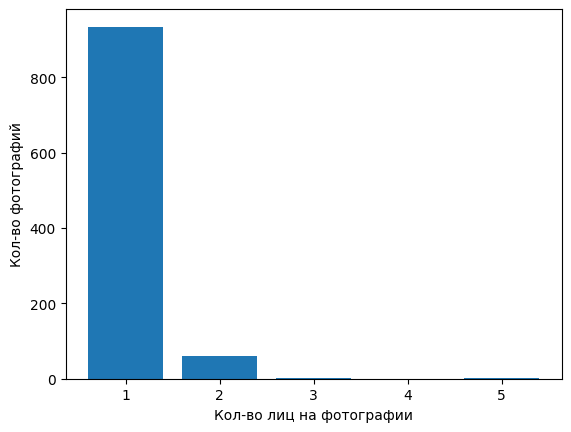

---------------------------------------------
Размер - (1024, 1024): 999 фотографий


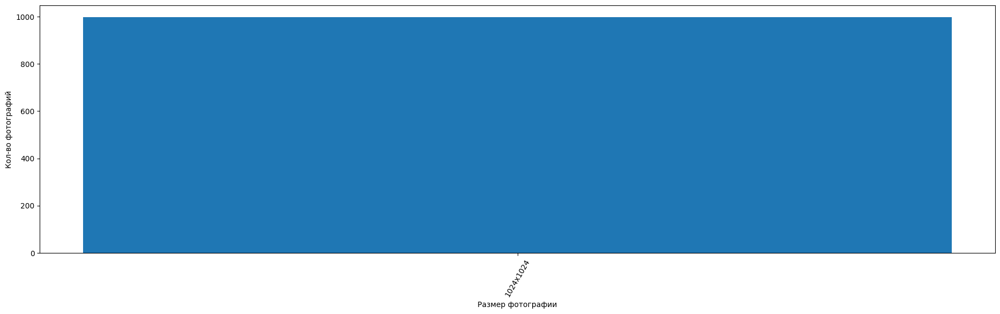

---------------------------------------------
Фотография с максимальным количеством лиц (5 лиц): 09346.png


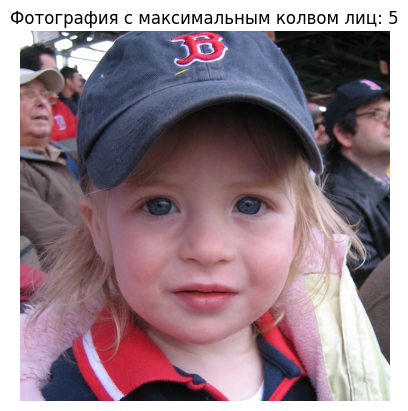

In [25]:
images_counter = 0 # счетчик фотографий в папке
label_counter = 0 # счетчик файлов txt в папке
true_label = 0 # счетчик файлов с разметкой в папке
num_people = [] # список, куда сохраняется колво лиц на фотографии
num_stats = defaultdict(int) # словарь для подсчета статистики по распределению колва лиц на фотографии

max_people = 0 # максимальное колво размеченных лиц на фотографии
max_people_image = None # название картинки с максимальным колво размеченных лиц

size_stats = defaultdict(int) # словарь для статистики по размерам (ширина, высота)

# проходимся по всей папке с картинками, и считаем колво файлов
for image in os.listdir(images_dir): 
    images_counter+=1

    # проверка размера изображения
    image_path = os.path.join(images_dir, image)
    # пробуем открыть фото используя pillow
    try:
        with Image.open(image_path) as img:
            # определяем ширину и высоту изображения
            width, heigh = img.size
            # обновляем статистику
            size_stats[(width, heigh)] += 1
    # если не получилось открыть, печатаем ошибку
    except Exception as e:
        print(f'Ошибка при открытии фото {image}: {e}')

# проходимся по всей папке с разметкой, и считаем колво файлов
for label in os.listdir(labels_dir):
    label_counter+=1
    # открываем файл с разметкой на чтение
    with open(os.path.join(labels_dir,label), 'r') as f:
        # считываем все строки в файле
        lines = f.readlines()\
        # если строк больше 0, значит в файле есть хотя бы 1 разметка
        if len(lines) > 0:
            true_label+=1
            # счетчик колва лиц на одной фотографии
            num = 0
            # проходимся по каждой строке, и обноваляем счетчик
            for line in lines:
                num+=1
            # добавляем колво в список
            num_people.append(num)
            # добавляем колво в словарь и\или обновляем значение в нем
            num_stats[num] += 1
            # если колво лиц больше чем максимальное, то обновляем максимальное значение лиц на фото
            if num > max_people:
                max_people = num
                # сохраняем название картинки с текущим максимальным колво людей
                max_people_image = label.replace('.txt', '.png')

# выводим результаты анализа датасета
print(f'Всего фотографий: {images_counter}')
print(f'Всего .txt файлов: {label_counter}')
print(f'Всего файлов с разметкой: {true_label}')
print(f'Варианты кол-ва людей: {list(set(num_people))}')
print('---------------------------------------------')

# выводим статистику по распределению колва лиц на фотографии
for num, count in num_stats.items():
    print(f'Кол-во людей {num}: {count} фотографий')

# выводим график по распределению колва лиц на фотографии
plt.bar(num_stats.keys(), num_stats.values())
plt.xlabel('Кол-во лиц на фотографии')
plt.ylabel('Кол-во фотографий')
plt.show()

print('---------------------------------------------')

# выводим статистику по распределению размеров фотографий
for size, count in size_stats.items():
    print(f'Размер - {size}: {count} фотографий')

# подготавливаем размеры для вывода на график
sizes = [f'{w}x{h}' for w,h in size_stats.keys()]
counts = list(size_stats.values())
# выводим график по распределению колва лиц на фотографии
plt.figure(figsize=(23,6))
plt.bar(sizes, counts)
plt.xlabel('Размер фотографии')
plt.ylabel('Кол-во фотографий')
plt.xticks(rotation=60)
plt.show()

print('---------------------------------------------')

print(f'Фотография с максимальным количеством лиц ({max_people} лиц): {max_people_image}')
max_image_path = os.path.join(images_dir, max_people_image)

# загружаем фото в нужный формат, используя cv2
image = cv2.imread(max_image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# отображаем фотографию с максимальным колвом лиц, используя plt
plt.imshow(image)
plt.title(f'Фотография с максимальным колвом лиц: {max_people}')
plt.axis('off') # скрываем оси
plt.show()



**можно заметить, что:**
- всего у нас 1154 фотографии, к каждой фотографии есть разметка `(не пустая)`
- кол-во размеченных довольно вариативное, но в основном на фотографиях `не более 2х лиц`
- в основном размеры фото - `1024х1024`
- макс колво размеченных лиц на фото - `11`

**Для более удобной и точной работы с фотографиями, приведем все фотографии к одному размеру - `1024x1024`**:

In [26]:
# реализуем функцию для обновления разметки, пропорционально новому размеру фотографии
# она принимает путь к разметке, старый размер, и требуемый размер (в нашем случае, по дефолту 1024x1024)
def resize_label(lbl_path, orig_size, new_size=(1024, 1024)):
    # открываем файл с разметкой в режиме чтения     
    with open(lbl_path, 'r') as file:
        lines = file.readlines()
    # список для сохранения новых строк с разметкой
    updated_lines = []
    # проходимся по каждой строке в файле 
    for line in lines:
        # парсим строку получая нужные значения
        class_id, x_center, y_center, width, height = map(float, line.split())
        
        # масштабируем координаты
        x_center *= new_size[0] / orig_size[0]
        y_center *= new_size[1] / orig_size[1]
        width *= new_size[0] / orig_size[0]
        height *= new_size[1] / orig_size[1]

        # нормализуем координаты относительно нового размера
        x_center /= new_size[0]
        y_center /= new_size[1]
        width /= new_size[0]
        height /= new_size[1]

        # сохраняем обновленные линии с разметкой в список
        updated_lines.append(f"{int(class_id)} {x_center} {y_center} {width} {height}\n")
    # сохраняем обновленный файл 
    with open(lbl_path, 'w') as file:
        file.writelines(updated_lines)

In [27]:
# используя реализованную функцию, поменяем размер у некоторых изображений
for image_name in os.listdir(images_dir):
    # путь к изображению
    image_path = os.path.join(images_dir, image_name)
    # путь к разметке для данного фото
    lbl_path = os.path.join(labels_dir, os.path.splitext(image_name)[0] + '.txt')
    # открываем фото используя PIL
    with Image.open(image_path) as img:
        # сначала проверяем размер
        if img.size != (1024,1024):
            # сохраняем оригинальный размер
            orig_size = img.size
            # меняем размер фотографии
            img = img.resize(size)
            # сохраняем фотографию по тому же пути
            img.save(image_path)

            # обновляем разметку используя функцию
            resize_label(lbl_path, orig_size)

            # логирование
            print(image_name)
            print(orig_size)
            print(img.size)
            print('----------------------------------------')



**Для того чтобы модели было легче обучиться искать основные фичи лиц, я удалю все фотографии, на которых площадь боксов меньше 20% самого изображения**

-----------------------------------------------------


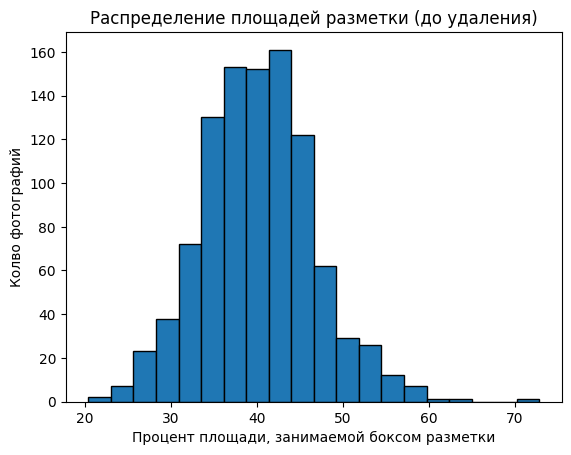

-----------------------------------------------------
Удалено изображений: 0
Удалено файлов разметки: 0
-----------------------------------------------------


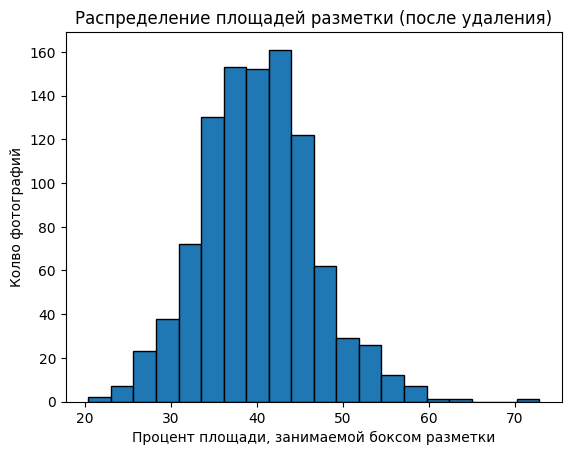

In [28]:
# список для хранения процентов площади боксов
areas_perc = []
# второй список с удаленными лишними
areas_perc2 = []

# трешхолд 20%
area_tresh = 20

# счетчики удаленных файлов
rem_img = 0
rem_lbl = 0

# проходимся по всем изображениям
for image_name in os.listdir(images_dir):
    # получаем путь к изображению
    image_path = os.path.join(images_dir, image_name)
    # загрузка изображения
    image = cv2.imread(image_path)
    # получаем размеры изображения (ширину и высоту)
    height, width, _ = image.shape

    # получаем путь к файлу с разметкой
    label_name = os.path.splitext(image_name)[0] + '.txt'
    label_path = os.path.join(labels_dir, label_name)

    # если такой файл есть, то
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
        
        # общая площадь боксов
        total_area = 0
        
        # проходимся по каждой строке с разметкой
        for line in lines:
            # разбираем строку на составляющие
            class_id, x_center, y_center, bbox_width, bbox_height = map(float, line.split())
            # переводим координаты в пиксели
            bbox_width_px = bbox_width * width
            bbox_height_px = bbox_height * height

            # вычисляем площадь боксов
            bbox_area = bbox_width_px * bbox_height_px
            # добавляем в общую площадь
            total_area += bbox_area

        # вычисляем площадь самого изображения
        image_area = width * height
        # вычисляем процент площадт бокса
        area_perc = (total_area / image_area) * 100
        areas_perc.append(area_perc)
        # если площадь меньше порога, то удаляем и фотографию и разметку
        if area_perc < area_tresh:
            # удаляем фото и разметку
            os.remove(image_path)
            os.remove(label_path)
            # обновляем счетчики
            rem_img += 1
            rem_lbl += 1
            # логирование
            print(f"Удалено: {image_name} (площадь bb's: {area_perc:.2f}%)")
        else:
            areas_perc2.append(area_perc)
        

print('-----------------------------------------------------')

# визуализируем график изначального распределения занимаемой площади бокса
plt.hist(areas_perc, bins=20, edgecolor = 'black')
plt.xlabel('Процент площади, занимаемой боксом разметки')
plt.ylabel('Колво фотографий')
plt.title('Распределение площадей разметки (до удаления)')
plt.show()

print('-----------------------------------------------------')

# вывод итогов
print(f"Удалено изображений: {rem_img}")
print(f"Удалено файлов разметки: {rem_lbl}")

print('-----------------------------------------------------')

# визуализируем график конечного распределения занимаемой площади бокса
plt.hist(areas_perc2, bins=20, edgecolor = 'black')
plt.xlabel('Процент площади, занимаемой боксом разметки')
plt.ylabel('Колво фотографий')
plt.title('Распределение площадей разметки (после удаления)')
plt.show()

**на этом графике видно, что после удаления по процентам площади, график распределения стал близок к нормальному, и большая часть разметок занимает 40 процентов изображения**

---------------------------------------------------------

для просмотра разметки я буду использовать `YOLO Annotation Tool` 

чтобы приступить к работе с ним, надо перейти на [репозиторий с YAT](https://github.com/Rainfue/YAT), загрузить его как архив, и разахрхивировать его себе на компьютер

*пример кода*
```py
with zipfile.ZipFile(r'C:\Users\user1\Project\face_recognition\Module1\YAT\YAT-main.zip', 'r') as zip:
    zip.extractall(r'C:\Users\user1\Project\face_recognition\Module1\YAT')
```

далее, надо запустить файл `Annotate.html` и приступить к работе

для того чтобы просматривать разметку, надо создать  `.txt` файл с классами (у нас 1 класс, лицо)

*вот так выглядит `classes.txt`:*

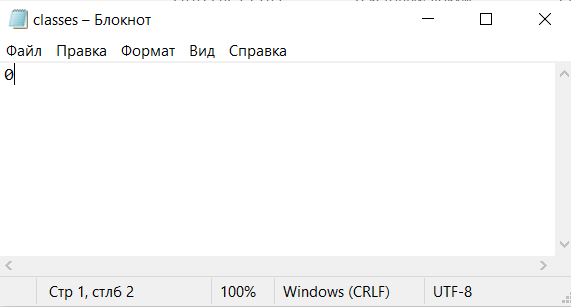

после этого, можно загрузить `txt` файл с классами, `фотографии` и `разметку` к ним, для того чтобы начать просматривать датасет

*я стараюсь оставить в датасете только те фото и разметки, которые охватывают не менее 20% лица, человек не стоит к нам спиной, лицо не слишком маленькое и видно основные части лица*

**до переразметки:**

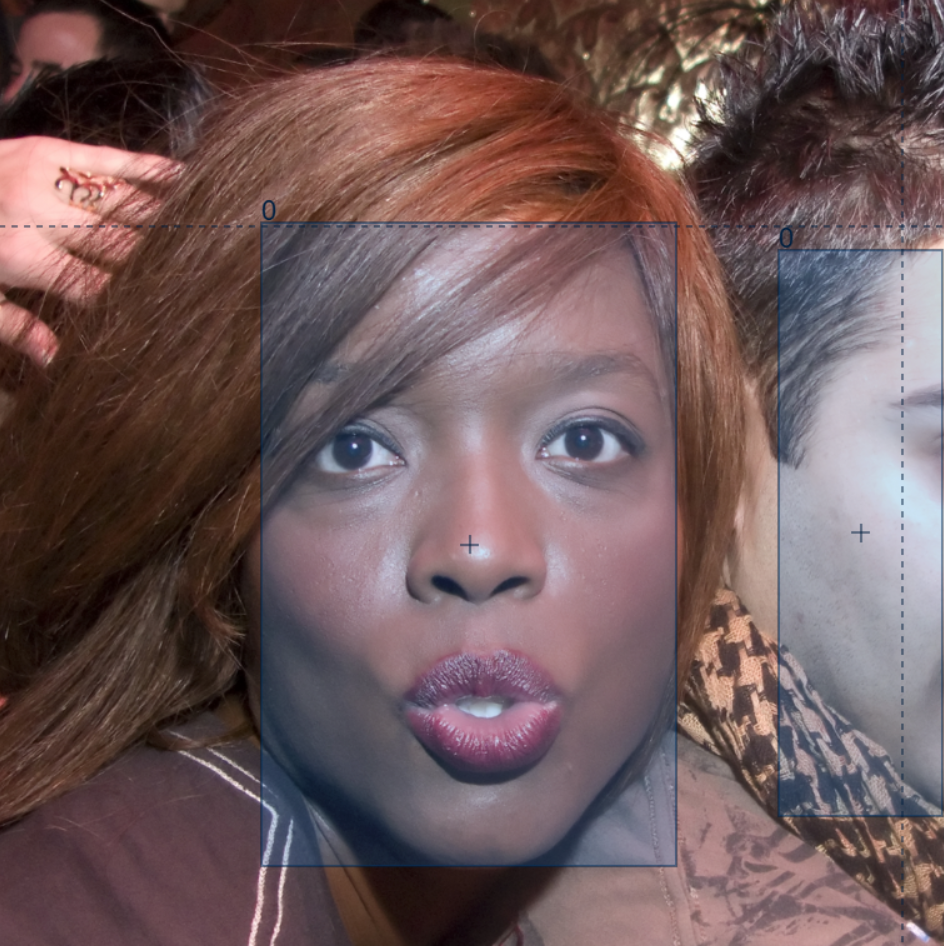
*почти не видно второе лицо*

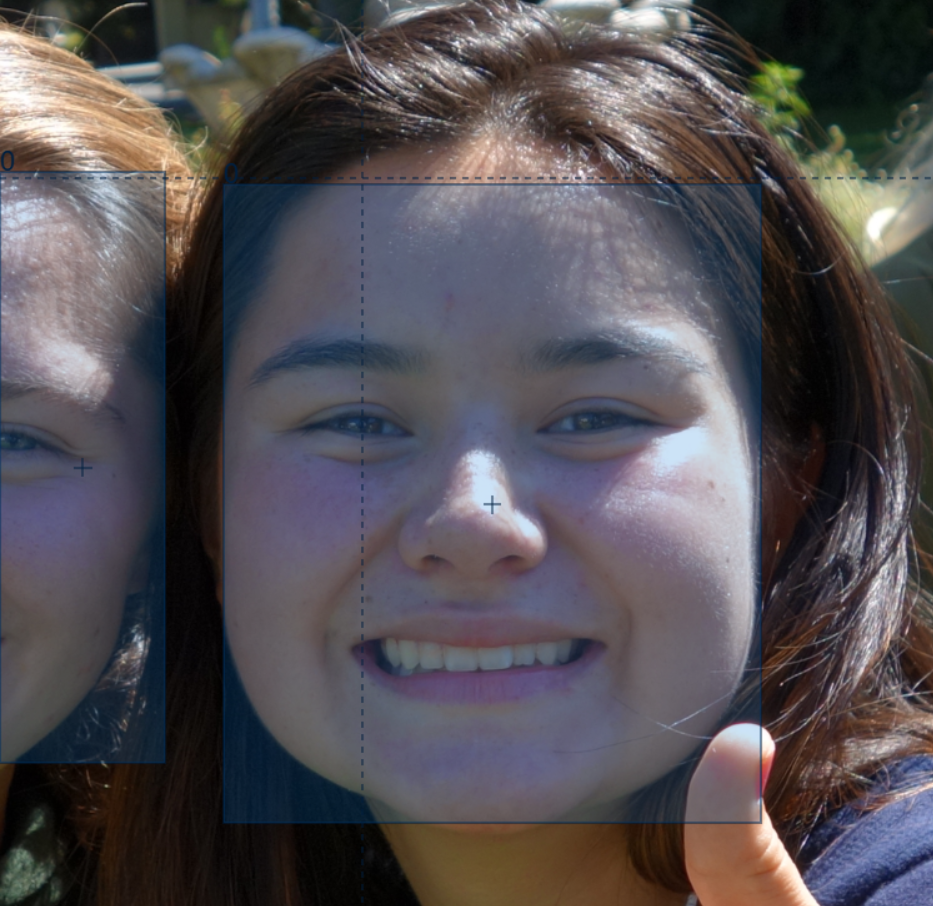
*почти не видно второе лицо*

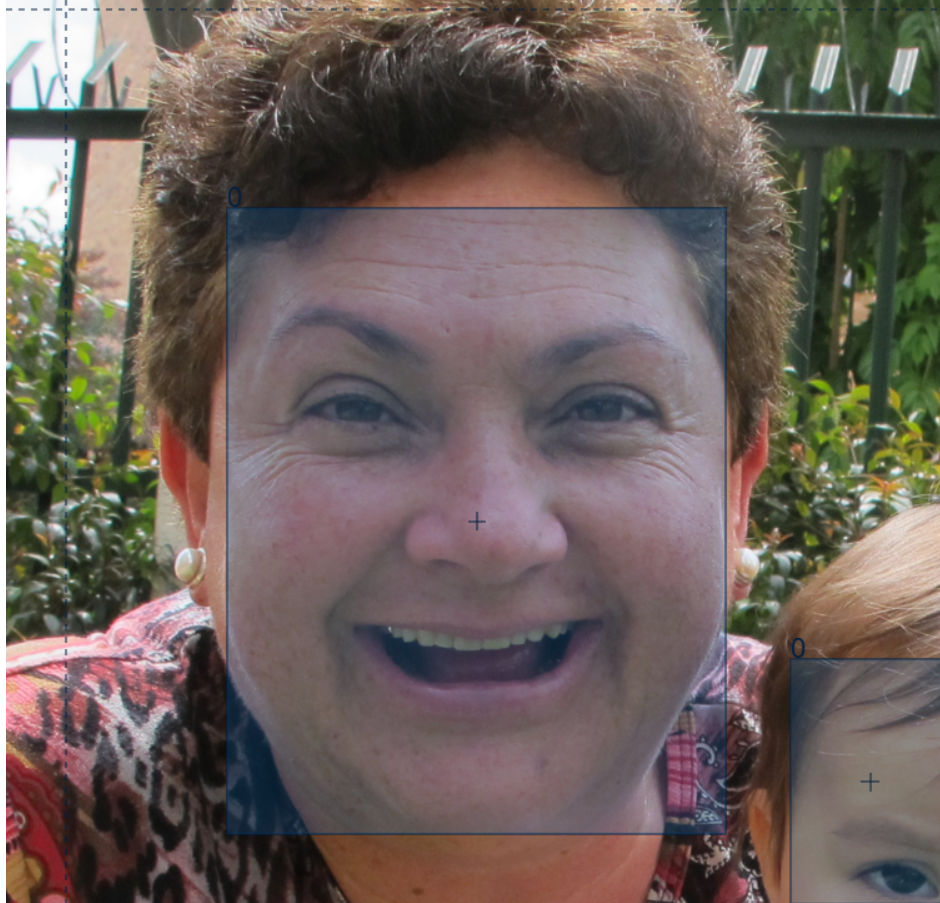
*почти не видно второе лицо*

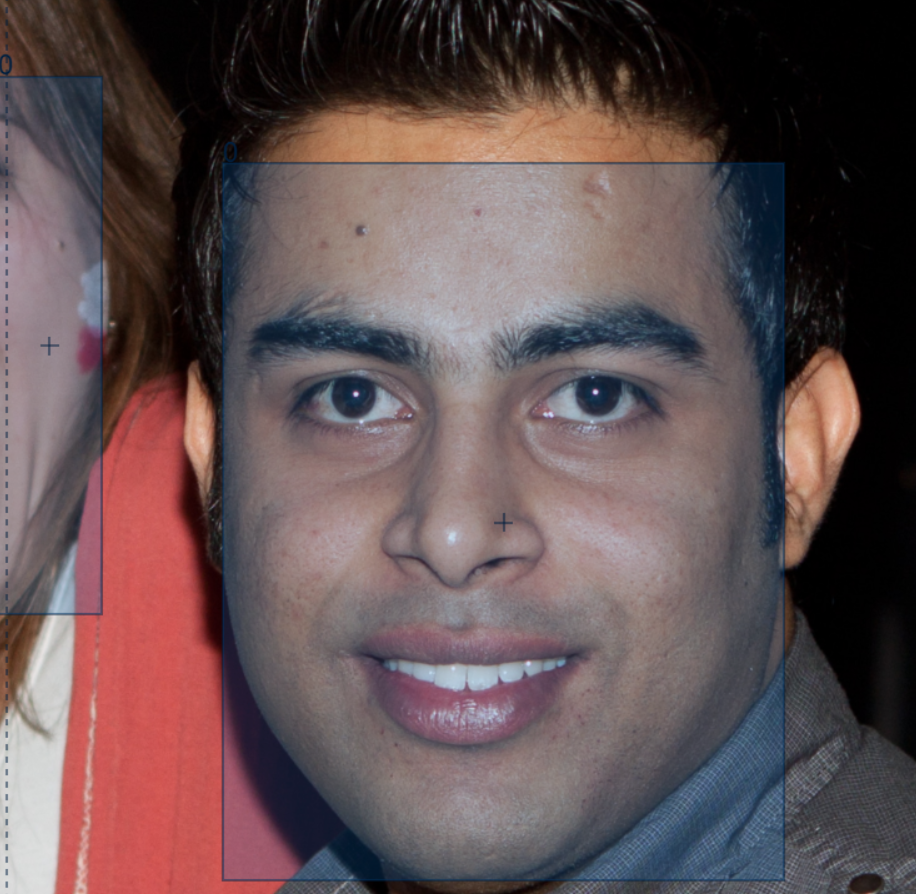
*почти не видно второе лицо*

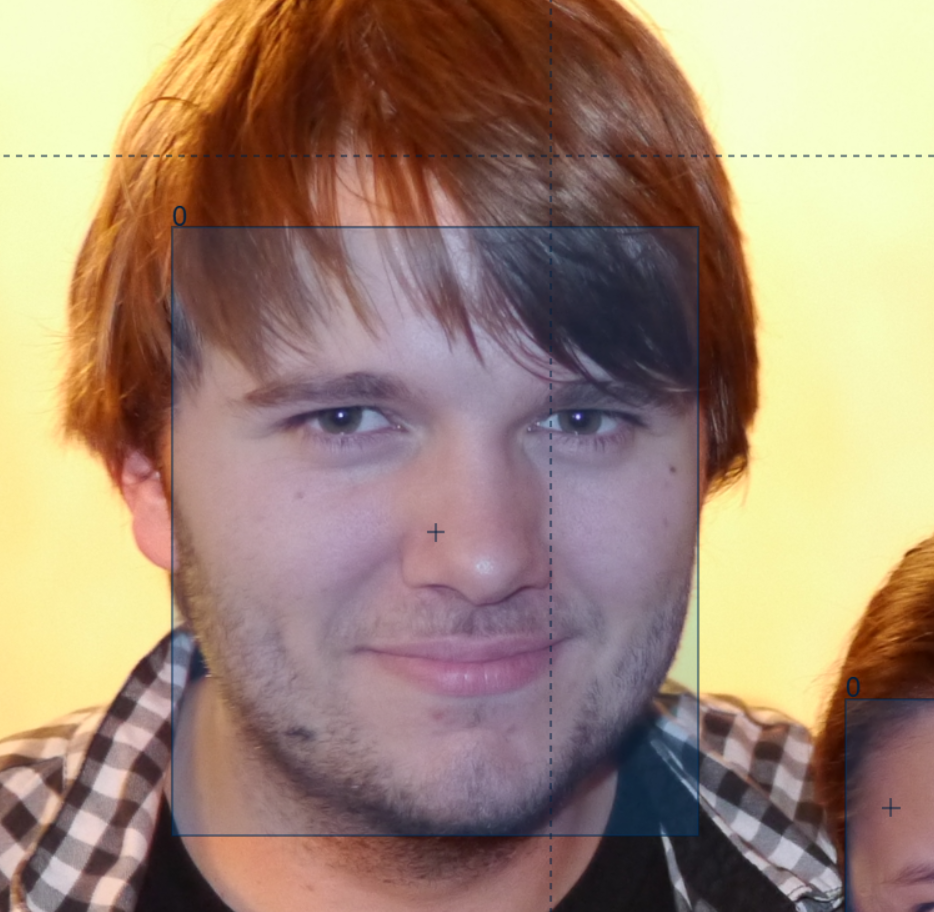
*почти не видно второе лицо*

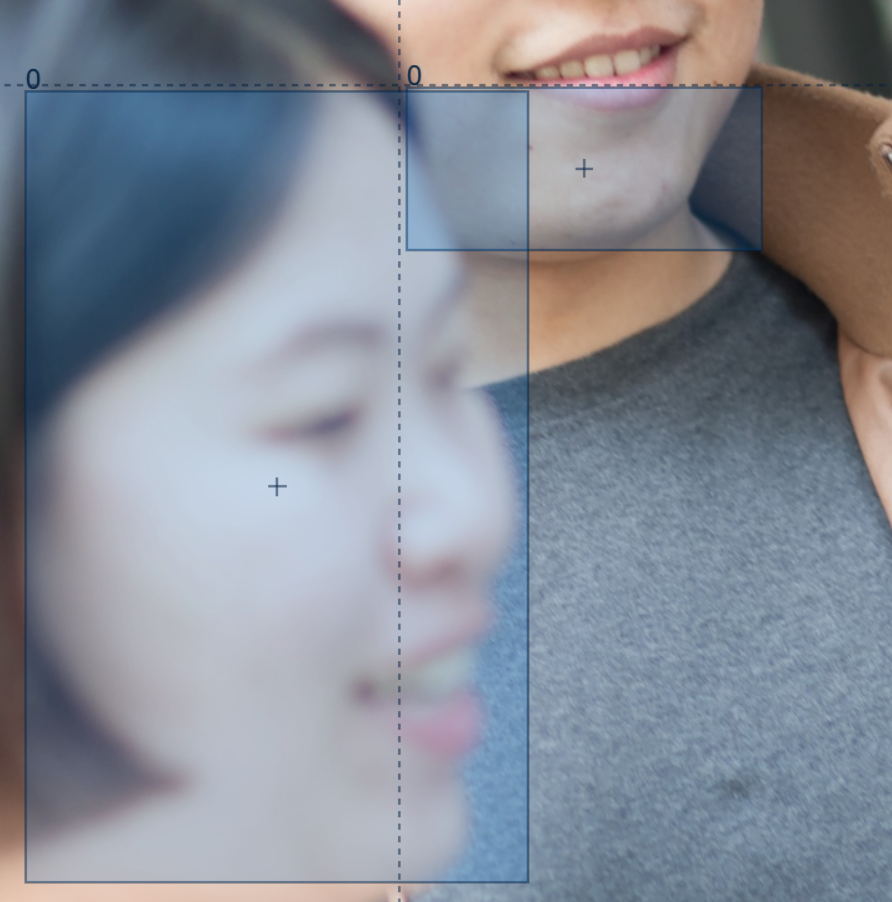
*почти не видно второе лицо и плохо размеченно*

**после переразметки:**

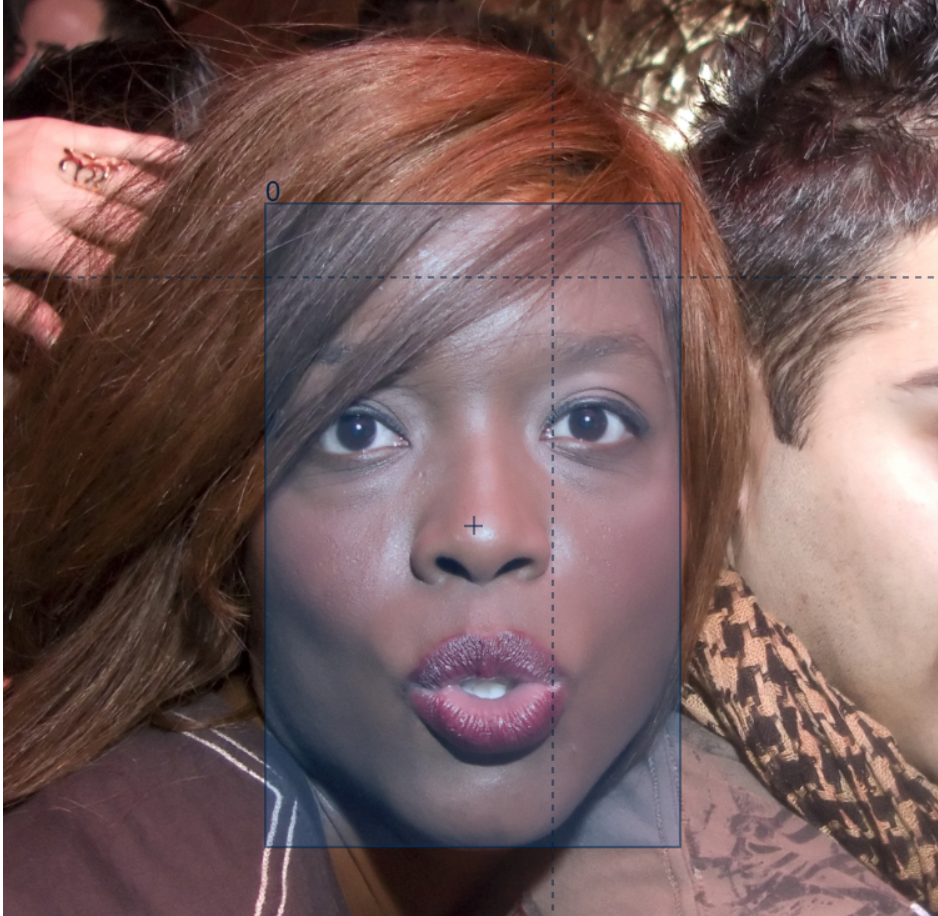
*удалена лишняя разметка*

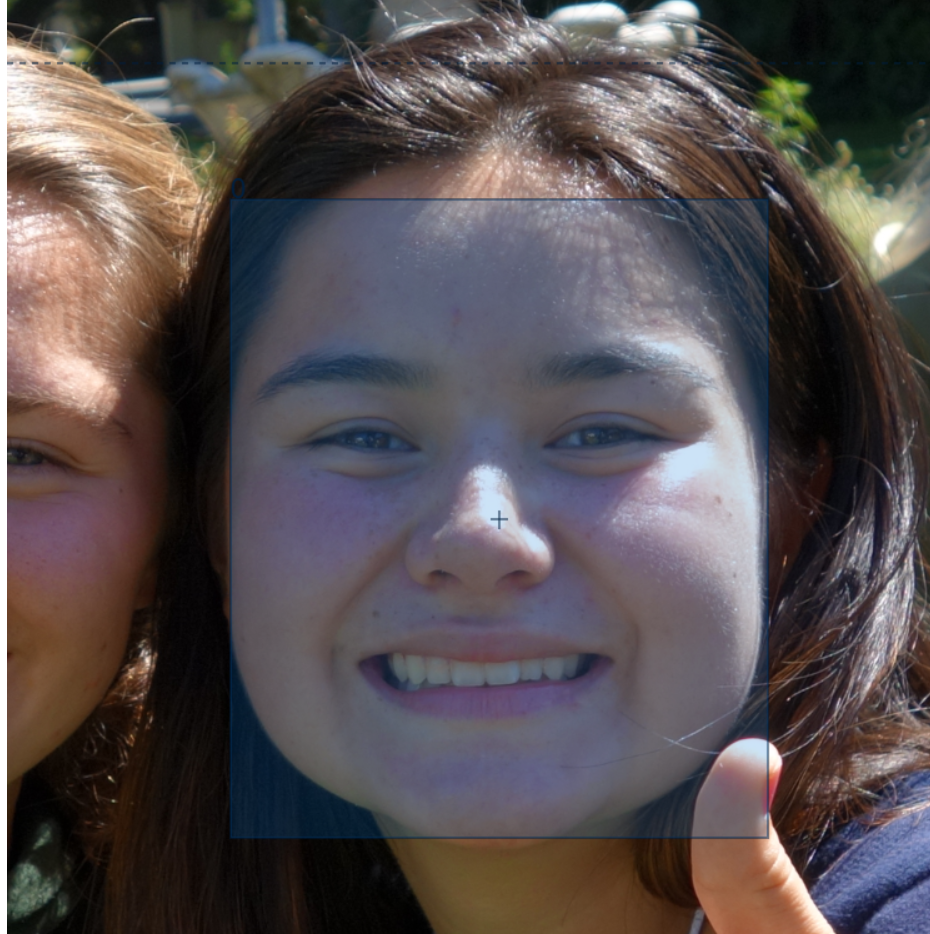
*удалена лишняя разметка*

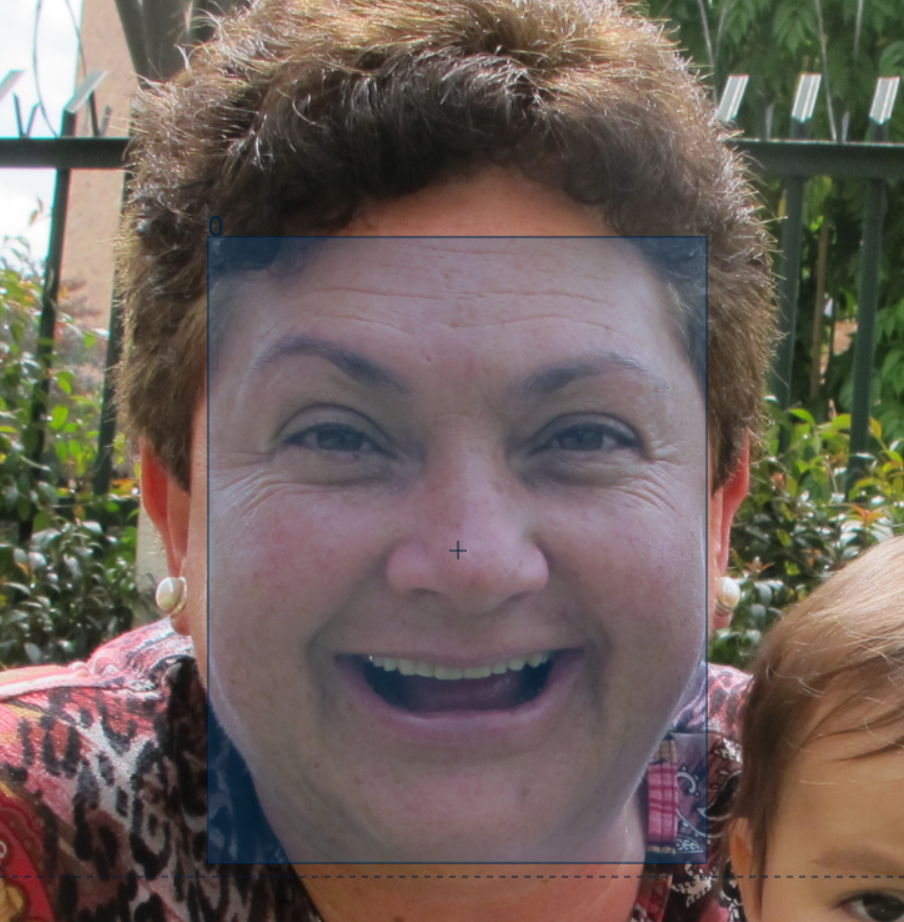
*удалена лишняя разметка*

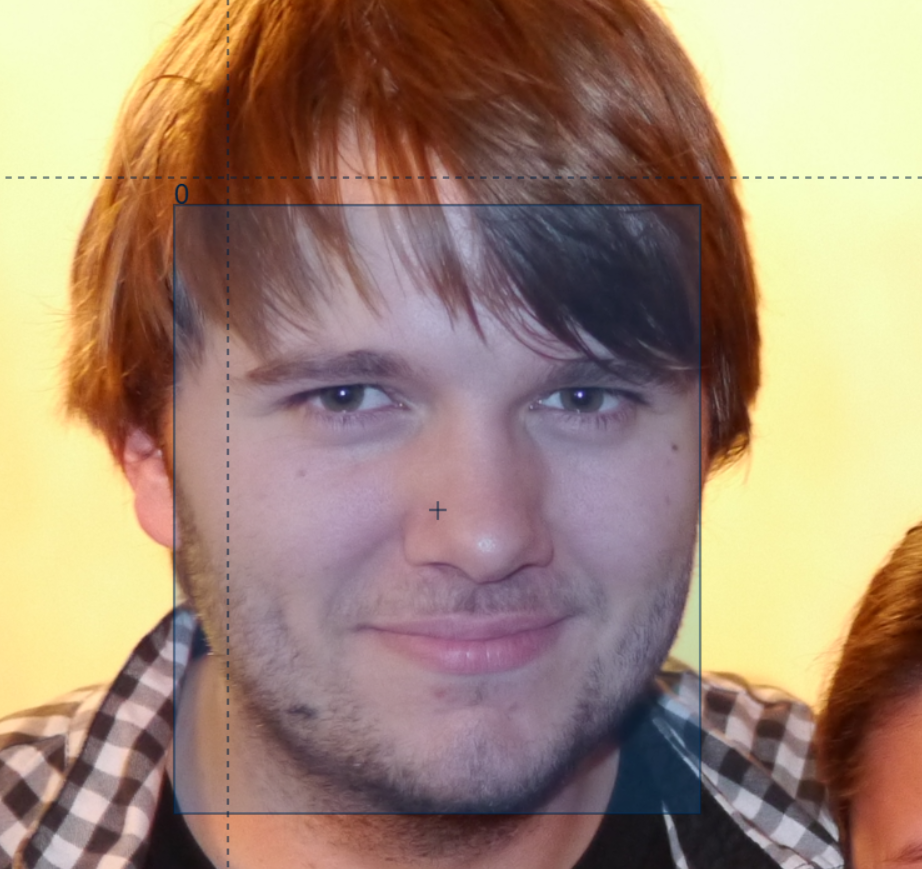
*удалена лишняя разметка*

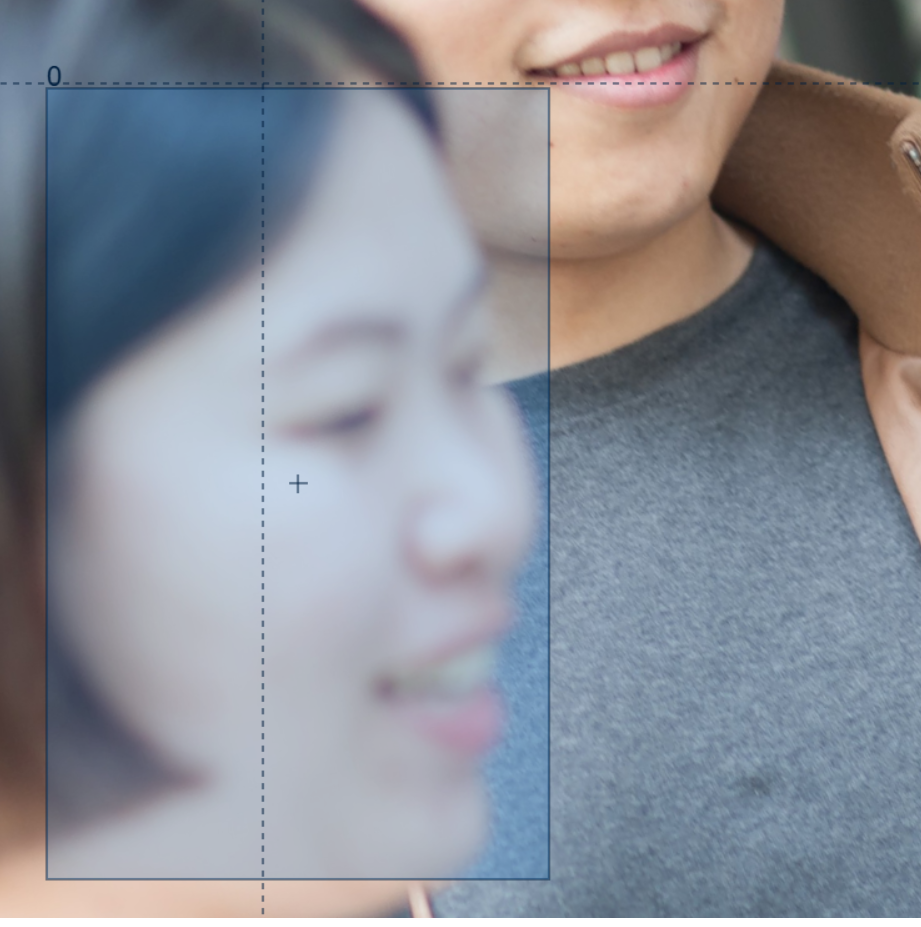
*удалена лишняя разметка*



**После переразметку вручную, и всех преобразований до этого, выполню первоначальный анализ еще раз**

Всего фотографий: 999
Всего .txt файлов: 999
Всего файлов с разметкой: 999
Варианты кол-ва людей: [1, 2, 3, 5]
---------------------------------------------
Кол-во людей 2: 61 фотографий
Кол-во людей 1: 934 фотографий
Кол-во людей 3: 3 фотографий
Кол-во людей 5: 1 фотографий


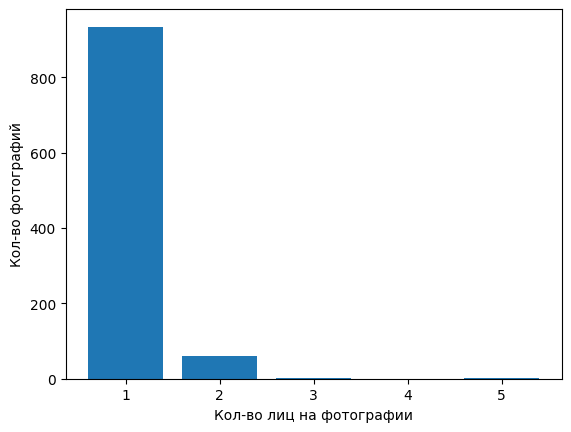

---------------------------------------------
Размер - (1024, 1024): 999 фотографий


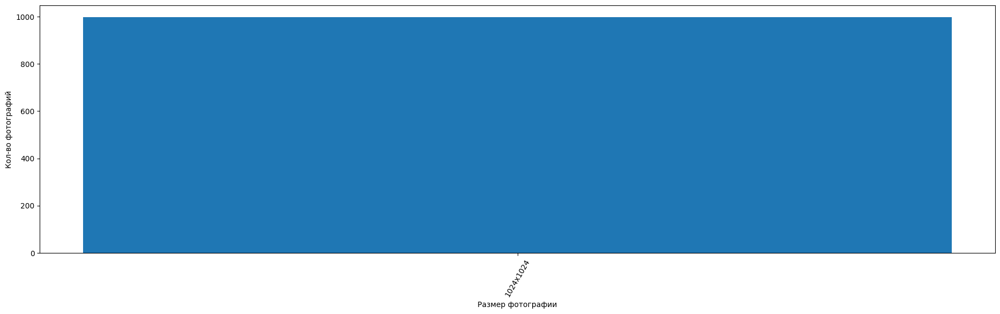

---------------------------------------------
Фотография с максимальным количеством лиц (5 лиц): 09346.png


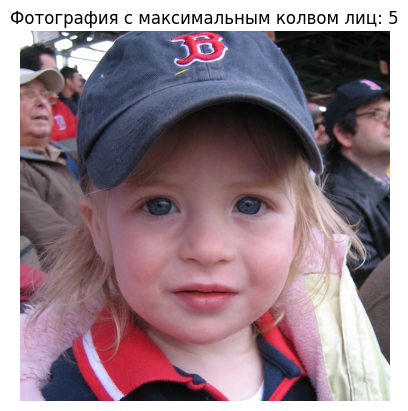

In [29]:
images_counter = 0 # счетчик фотографий в папке
label_counter = 0 # счетчик файлов txt в папке
true_label = 0 # счетчик файлов с разметкой в папке
num_people = [] # список, куда сохраняется колво лиц на фотографии
num_stats = defaultdict(int) # словарь для подсчета статистики по распределению колва лиц на фотографии

max_people = 0 # максимальное колво размеченных лиц на фотографии
max_people_image = None # название картинки с максимальным колво размеченных лиц

size_stats = defaultdict(int) # словарь для статистики по размерам (ширина, высота)

# проходимся по всей папке с картинками, и считаем колво файлов
for image in os.listdir(images_dir): 
    images_counter+=1

    # проверка размера изображения
    image_path = os.path.join(images_dir, image)
    # пробуем открыть фото используя pillow
    try:
        with Image.open(image_path) as img:
            # определяем ширину и высоту изображения
            width, heigh = img.size
            # обновляем статистику
            size_stats[(width, heigh)] += 1
    # если не получилось открыть, печатаем ошибку
    except Exception as e:
        print(f'Ошибка при открытии фото {image}: {e}')

# проходимся по всей папке с разметкой, и считаем колво файлов
for label in os.listdir(labels_dir):
    label_counter+=1
    # открываем файл с разметкой на чтение
    with open(os.path.join(labels_dir,label), 'r') as f:
        # считываем все строки в файле
        lines = f.readlines()\
        # если строк больше 0, значит в файле есть хотя бы 1 разметка
        if len(lines) > 0:
            true_label+=1
            # счетчик колва лиц на одной фотографии
            num = 0
            # проходимся по каждой строке, и обноваляем счетчик
            for line in lines:
                num+=1
            # добавляем колво в список
            num_people.append(num)
            # добавляем колво в словарь и\или обновляем значение в нем
            num_stats[num] += 1
            # если колво лиц больше чем максимальное, то обновляем максимальное значение лиц на фото
            if num > max_people:
                max_people = num
                # сохраняем название картинки с текущим максимальным колво людей
                max_people_image = label.replace('.txt', '.png')

# выводим результаты анализа датасета
print(f'Всего фотографий: {images_counter}')
print(f'Всего .txt файлов: {label_counter}')
print(f'Всего файлов с разметкой: {true_label}')
print(f'Варианты кол-ва людей: {list(set(num_people))}')
print('---------------------------------------------')

# выводим статистику по распределению колва лиц на фотографии
for num, count in num_stats.items():
    print(f'Кол-во людей {num}: {count} фотографий')

# выводим график по распределению колва лиц на фотографии
plt.bar(num_stats.keys(), num_stats.values())
plt.xlabel('Кол-во лиц на фотографии')
plt.ylabel('Кол-во фотографий')
plt.show()

print('---------------------------------------------')

# выводим статистику по распределению размеров фотографий
for size, count in size_stats.items():
    print(f'Размер - {size}: {count} фотографий')

# подготавливаем размеры для вывода на график
sizes = [f'{w}x{h}' for w,h in size_stats.keys()]
counts = list(size_stats.values())
# выводим график по распределению колва лиц на фотографии
plt.figure(figsize=(23,6))
plt.bar(sizes, counts)
plt.xlabel('Размер фотографии')
plt.ylabel('Кол-во фотографий')
plt.xticks(rotation=60)
plt.show()

print('---------------------------------------------')

print(f'Фотография с максимальным количеством лиц ({max_people} лиц): {max_people_image}')
max_image_path = os.path.join(images_dir, max_people_image)

# загружаем фото в нужный формат, используя cv2
image = cv2.imread(max_image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# отображаем фотографию с максимальным колвом лиц, используя plt
plt.imshow(image)
plt.title(f'Фотография с максимальным колвом лиц: {max_people}')
plt.axis('off') # скрываем оси
plt.show()



**Теперь, осталось только разделить датасет на `тренировочный`, `валидационный` и `тестовый`:**

In [19]:
# пути для изображений и разметок
image_dir = r'D:\Helper\MLBazyak\homework\some_data\face_det\Custom_Data\images\train'
label_dir = r'D:\Helper\MLBazyak\homework\face_recognition\data\labels'
out_dir = r'D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_det'

# создаем выходные пути для train, test И valid
# для тренировочного набора
os.makedirs(os.path.join(out_dir, 'train/images'), exist_ok=True) # картинки
os.makedirs(os.path.join(out_dir, 'train/labels'), exist_ok=True) # разметка
# для тестового набора
os.makedirs(os.path.join(out_dir, 'test/images'), exist_ok=True) # картинки
os.makedirs(os.path.join(out_dir, 'test/labels'), exist_ok=True) # разметка
# для валидационного набора
os.makedirs(os.path.join(out_dir, 'valid/images'), exist_ok=True) # картинки
os.makedirs(os.path.join(out_dir, 'valid/labels'), exist_ok=True) # разметка

In [20]:
# получаем список всех изображений
images = os.listdir(image_dir)
# логирование
print(len(images),'- колво фотографий')

999 - колво фотографий


In [23]:
# разделяем датасет на 3 выборки: 70% train, 15% valid и 15% test
train_img, test_img = train_test_split(images, test_size=0.3, random_state=42)
val_img, test_img = train_test_split(test_img, test_size=0.5, random_state=42)
# где images и test_img - выборка которую мы разделяем, test_size - процент, который будет составлять тестовая выборка при разделении
# random_state - сид, для воспроизводимости

print(len(train_img), 'train len')
print(len(test_img), 'test len')
print(len(val_img), 'valid len')

699 train len
150 test len
150 valid len


*реализуем функцию, для копирования фотографий и их разметок в нужные папки*

In [25]:
# функция для копирования файлов
def files_copy(files, img, labels, out_img, out_labels):
    # проходимся по каждой фотке из выборок
    for file in files:
        # копируем фотографии
        shutil.copy(os.path.join(img, file), os.path.join(out_img, file))
        # копируем разметку
        # инициализируем название разметки
        label_file = os.path.splitext(file)[0] + '.txt'
        # копируем файл с разметкой в нужную папку
        shutil.copy(os.path.join(labels, label_file), os.path.join(out_labels, label_file))
    
    # логирование
    print(len(os.listdir(out_img)), '- размер папки с изображениями')
    print(len(os.listdir(out_labels)), '- размер папки с разметками')
    print('----------------------------------------------')

После того как мы реализовали функцию, можно начать раскидывать файлы по папкам

In [26]:
# копируем тренировочную выборку
files_copy(train_img, image_dir, label_dir, os.path.join(out_dir, 'train/images'), os.path.join(out_dir, 'train/labels'))
# копируем тестовую выборку
files_copy(test_img, image_dir, label_dir, os.path.join(out_dir, 'test/images'), os.path.join(out_dir, 'test/labels'))
# копируем валидационную выборку
files_copy(val_img, image_dir, label_dir, os.path.join(out_dir, 'valid/images'), os.path.join(out_dir, 'valid/labels'))

699 - размер папки с изображениями
699 - размер папки с разметками
----------------------------------------------
150 - размер папки с изображениями
150 - размер папки с разметками
----------------------------------------------
150 - размер папки с изображениями
150 - размер папки с разметками
----------------------------------------------


**После разбиения на `тренировочную`, `тестовую` и `валидационную` выборки, получилось что:**
- train выборка: `699` фотографий и разметок к ним
- test выборка: `150` фотографий и разметок к ним
- valid выборка: `150` фотографий и разметок к ним

**Весь датасет содержит в себе 999 фотографий** *(чего хватит для обучения модели)*

**Теперь датасет для детекции готов для работы с моделью, и новая структура выглядит так:**

└── face_det/    

    └── train/
        └── images/
            └── 09007.jpg          # экземпляр фото c лицом
            └── 09008.jpg          # экземпляр фото c лицом
        └── labels/  
            └── 09007.txt          # экземпляр разметки
            └── 09008.txt          # экземпляр разметки
    └── test/ 
        └── images/
            └── 09009.jpg          # экземпляр фото c лицом
            └── 09010.jpg          # экземпляр фото c лицом
        └── labels/  
            └── 09009.txt          # экземпляр разметки
            └── 09010.txt          # экземпляр разметки
    └── valid/
        └── images/
            └── 09011.jpg          # экземпляр фото c лицом
            └── 09012.jpg          # экземпляр фото c лицом
        └── labels/  
            └── 09011.txt          # экземпляр разметки
            └── 09012.txt          # экземпляр разметки



## Датасет для распознавания лиц

**Структура данных в наборе:**

└── face_ind/    

    ├── lfw-deepfunneled/
        └── lfw-deepfunneled/
            └── Aaron_Eckhart/                           # имя человека
                └── Aaron_Eckhart_0001.jpg               # экземпляр фото человека
            └── Aaron_Guiel/  
                └── Aaron_Guiel_0001.jpg                
            └── Aaron_Patterson/
                └── Aaron_Patterson_0001.jpg
            └── etc ...
            
    ├── lfw_allnames.csv                                 # csv файл с подсчетом колва фотографий на имя
    ├── lfw_readme.csv      
    ├── matchpairsDevTest.csv      
    ├── matchpairsDevTrain.csv      
    ├── mismatchpairsDevTest.csv      
    ├── mismatchpairsDevTrain.csv      
    ├── pairs.csv      
    ├── people.csv                                       # csv файл с подсчетом колва фотографий на имя   
    ├── peopleDevTest.csv      
    ├── peopleDevTrain.csv      
    ├── archive.zip                                      # изначальный архив с данными


In [63]:
# назначаю путь для изображений
image_dir = r'D:\Helper\MLBazyak\homework\some_data\face_ind\lfw-deepfunneled\lfw-deepfunneled'

**Для того чтобы в дальнейшем обучать модель, мне надо будет разделить выборку на тренировочную, тестовую и валидационную. Следовательно, мне нужно минимум три фотографии на человека:**

In [64]:
# проверяем, сколько папок с именами и фотографий всего есть в выборке изначально
# счетчик колва фотографий
img_count = 0
# проходимся по каждой папке с именем в выборке
for name in os.listdir(image_dir):
    # определяем колво фото в папке и обноваляем счетчик
    img_count += len(os.listdir(os.path.join(image_dir, name)))
# логирование
print(f'Изначальный размер выборки: {len(os.listdir(image_dir))} имен, {img_count} фотографий')

# проходимся по каждой папке с именем в выборке
for name in os.listdir(image_dir):
    # определяем путь к папке с именем
    name_path = os.path.join(image_dir, name)
    # проверяем, не меньше ли 3х фотографий в папке с именем
    if len(os.listdir(name_path)) < 3:
        # если меньше, то удаляем папку 
        shutil.rmtree(name_path)
        # логирование
        print(f'{name} не прошел порог, удаление...')

# проверяем, сколько папок с именами и фотографий всего есть в выборке после удаления
# счетчик колва фотографий
img_count = 0
# проходимся по каждой папке с именем в выборке
for name in os.listdir(image_dir):
    # определяем колво фото в папке и обноваляем счетчик
    img_count += len(os.listdir(os.path.join(image_dir, name)))
# логирование
print(f'Размер выборки после удаления: {len(os.listdir(image_dir))} имен, {img_count} фотографий')

Изначальный размер выборки: 5749 имен, 13233 фотографий
Aaron_Eckhart не прошел порог, удаление...
Aaron_Guiel не прошел порог, удаление...
Aaron_Patterson не прошел порог, удаление...
Aaron_Pena не прошел порог, удаление...
Aaron_Sorkin не прошел порог, удаление...
Aaron_Tippin не прошел порог, удаление...
Abbas_Kiarostami не прошел порог, удаление...
Abba_Eban не прошел порог, удаление...
Abdel_Aziz_Al-Hakim не прошел порог, удаление...
Abdel_Madi_Shabneh не прошел порог, удаление...
Abdel_Nasser_Assidi не прошел порог, удаление...
Abdulaziz_Kamilov не прошел порог, удаление...
Abdullah_Ahmad_Badawi не прошел порог, удаление...
Abdullah_Nasseef не прошел порог, удаление...
Abdullatif_Sener не прошел порог, удаление...
Abdul_Majeed_Shobokshi не прошел порог, удаление...
Abdul_Rahman не прошел порог, удаление...
Abel_Aguilar не прошел порог, удаление...
Abner_Martinez не прошел порог, удаление...
Abraham_Foxman не прошел порог, удаление...
Aby_Har-Even не прошел порог, удаление...
Adam

**Теперь, можно вывести топ 5 людей с наиболее большим количеством фотографий в выборке:**

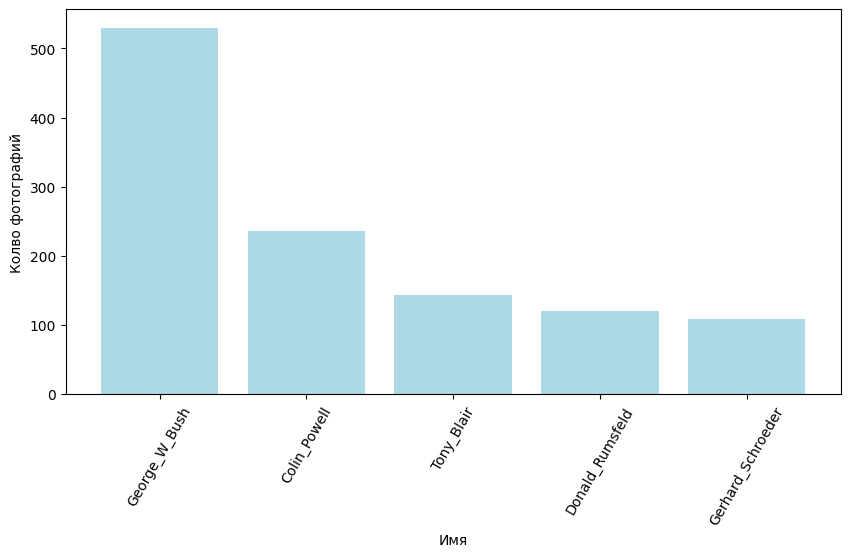

In [65]:
# создаем словарь для сохранения статистики колва фото по имени 
img_count_stats = defaultdict(int)

# проходимся по каждой папке с именем в выборке
for name in os.listdir(image_dir):
    # определяем колво фото в папке и обноваляем счетчик
    img_count_stats[name] = len(os.listdir(os.path.join(image_dir, name)))
# сортируем словарь, от большего к меньшего
img_count_stats = sorted(img_count_stats.items(),  key=lambda x: x[1], reverse=True)
# сохраняем топ 5 по колву имен в отдельную переменную
top5 = img_count_stats[:5]
# инициализируют имена и счетчики
names, counts = zip(*top5)

# визуализация результатов
plt.figure(figsize=(10,5))                 # размер графика
plt.bar(names, counts, color='lightblue')  # выводим бар-график
plt.xlabel('Имя')                          # подпись иксов
plt.ylabel('Колво фотографий')             # подпись игриков
plt.xticks(rotation=60)                    # делаем иксы под углом для удобства
plt.show()                                 # выводим график

**После того как мы `удалили все папки где фотографий нет или меньше 3х` и вывели топ 5 по заполненности имен, можно разделить датасет на `тренировочный`, `валидационный` и `тестовый`:**

In [66]:
# назначаем пути для изначального датасета
data_dir = r'D:\Helper\MLBazyak\homework\some_data\face_ind\lfw-deepfunneled\lfw-deepfunneled'
# и для выходного
out_dir = r'D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind'

# Пути для train, valid и test
train_dir = os.path.join(out_dir, 'train')
valid_dir = os.path.join(out_dir, 'valid')
test_dir = os.path.join(out_dir, 'test')

# логирование
for part in [train_dir, valid_dir, test_dir]:
    print(part)

# для каждой выборки создаем папку
for part in [train_dir, valid_dir, test_dir]:
    os.makedirs(part, exist_ok=True)

D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\train
D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\valid
D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\test


*после создания папок, можно переходить к разделению фотографий*

In [67]:
# проходим по каждому человеку в изначальной папке
for name in os.listdir(data_dir):
    # сохраняем путь к папке с именем
    name_dir = os.path.join(data_dir, name)
    # получаем все фотографии из папки
    images = os.listdir(name_dir)
    # разбиваем выборку на 70% train, 15% test и 15% valid
    train_img, test_img = train_test_split(images, test_size=0.3, random_state=42)
    # если фотографий достаточно, то разбиваем тестовый датасет еще на две пооловины 
    if len(test_img) >= 2:
        test_img, valid_img = train_test_split(test_img, test_size=0.5, random_state=42)
    # если нет, то в valid идет то же, что и в test
    else:
        valid_img = test_img

    # создаем папки для *имени* 
    # проходимся по каждой выборке
    for part in [train_dir, valid_dir, test_dir]:
        # создаем папку с именем в каждой выборке
        os.makedirs(os.path.join(part, name), exist_ok=True)

    # копируем фотографии в каждую выборку
    # проходимся по каждой фотографии
    for img in train_img:
        name_dir_img = os.path.join(train_dir, name)
        shutil.copy(os.path.join(name_dir, img), os.path.join(name_dir_img, img))
    # проходимся по каждой фотографии
    for img in test_img:
        name_dir_img = os.path.join(test_dir, name)
        shutil.copy(os.path.join(name_dir, img), os.path.join(name_dir_img, img))
    # проходимся по каждой фотографии
    for img in valid_img:
        name_dir_img = os.path.join(valid_dir, name)
        shutil.copy(os.path.join(name_dir, img), os.path.join(name_dir_img, img))

# логирование
print('--------------------------------------------')
print('Разделение датасета звершено')
print(f'Колво людей в тренировочном датасете: {len(os.listdir(train_dir))}')
print(f'Колво людей в тестовом датасете: {len(os.listdir(test_dir))}')
print(f'Колво людей в валидационном датасете: {len(os.listdir(valid_dir))}')
print('--------------------------------------------')

# счетчик всех картинок
img_all = 0
# проходимся по каждой выборке
for part in [train_dir, test_dir, valid_dir]:
    # счетчик картинок
    img_count = 0
    # проходимся по каждому имени в выборке
    for name in os.listdir(part):
        # проходимся по каждой картинке в имени
        for img in os.listdir(os.path.join(part, name)):
            
            # обновляем счетчик
            img_count+=1
    # логирование
    print(f'в папке {part}: {img_count} фотографий')
    print('--------------------------------------------')
    # обновляем общий счетчик фотографий
    img_all+=img_count
# логирование
print(f'всего фотографий: {img_all}')
print('--------------------------------------------')

--------------------------------------------
Разделение датасета звершено
Колво людей в тренировочном датасете: 901
Колво людей в тестовом датасете: 901
Колво людей в валидационном датасете: 901
--------------------------------------------
в папке D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\train: 4948 фотографий
--------------------------------------------
в папке D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\test: 1390 фотографий
--------------------------------------------
в папке D:\Helper\MLBazyak\homework\some_data\face_rec_data\face_ind\valid: 1559 фотографий
--------------------------------------------
всего фотографий: 7897
--------------------------------------------


**После разбиения на `тренировочную`, `тестовую` и `валидационную` выборки, получилось что:**
- train выборка: `4948` фотографий
- test выборка: `1390` фотографий
- valid выборка: `1559` фотографий

**Весь датасет содержит в себе 7897 фотографий** *(чего хватит для обучения модели)*

**Новая структура данных:**

└── face_ind/    

    └── train/
        └── Aaron_Peirsol/         # папка на имя человека
            └── Aaron_Peirsol_0001.jpg          # экземпляр фото 
            └── Aaron_Peirsol_0002.jpg          # экземпляр фото 
        └── Abdullah/         # папка на имя человека
            └── Abdullah_0001.jpg          # экземпляр фото 
            └── Abdullah_0002.jpg          # экземпляр фото 
        └── etc...

    └── train/
        └── Aaron_Peirsol/         # папка на имя человека
            └── Aaron_Peirsol_0003.jpg          # экземпляр фото 
            └── Aaron_Peirsol_0004.jpg          # экземпляр фото 
        └── Abdullah/         # папка на имя человека
            └── Abdullah_0003.jpg          # экземпляр фото 
            └── Abdullah_0004.jpg          # экземпляр фото 
        └── etc...

    └── train/
        └── Aaron_Peirsol/         # папка на имя человека
            └── Aaron_Peirsol_0005.jpg          # экземпляр фото 
            └── Aaron_Peirsol_0006.jpg          # экземпляр фото 
        └── Abdullah/         # папка на имя человека
            └── Abdullah_0005.jpg          # экземпляр фото 
            └── Abdullah_0006.jpg          # экземпляр фото 
        └── etc...
